# Численное моделирование задачи о распаде разрыва

Используем одномерное уравнение Навье-Стокса без источников и вязкости.
Одномерные уравнения Эйлера в консервативной форме записываются как система гиперболических уравнений:

$$
\frac{\partial \mathbf{U}}{\partial t} + \frac{\partial \mathbf{F(U)}}{\partial x} = 0,
$$

где $\mathbf{U}$ — вектор консервативных переменных, $\mathbf{F(U)}$ — вектор потоков.

Вектор консервативных переменных и вектор потоков:

$$
\mathbf{U} = \begin{pmatrix}
\rho \\
\rho u \\
E
\end{pmatrix}, \qquad
\mathbf{F(U)} = \begin{pmatrix}
\rho u \\
\rho u^2 + p \\
(E + p) u
\end{pmatrix},
$$

где:
- $\rho$ — плотность,
- $u$ — скорость,
- $E$ — полная энергия на единицу объема,
- $p$ — давление.

Для замыкания системы используем уравнение состояния идеального газа:

$$
p = (\gamma - 1)\left(E - \frac{1}{2} \rho u^2\right),
$$

где $\gamma$ — показатель адиабаты (для воздуха $\gamma = 1.4$).

Скорость звука:
$$
a = \sqrt{\gamma \cdot \frac{p}{\rho}}
$$

## Начальные и граничные условия

### Начальные условия

Предполагается наличие разрыва в начальный момент времени $t = 0$ в центре области $x = 0.5$:

- Для $x < 0.5$:
  - $\rho_L = 1.0$,
  - $u_L = 0.0$,
  - $p_L = 1.0$.

- Для $x \geq 0.5$:
  - $\rho_R = 0.125$,
  - $u_R = 0.0$,
  - $p_R = 0.1$.

### Граничные условия

Используются **отражающие граничные условия** (жесткие стенки):

- На левой границе $x = 0$: значения консервативных переменных в первой ячейке приравниваются значениям во второй ячейке.
- На правой границе $x = 1$: значения в последней ячейке приравниваются значениям в предпоследней ячейке.

Это обеспечивает отсутствие потока через границы и отражение волн.

## Вычисление потоков

**Поток HLL** используется для аппроксимации численного потока через границы ячеек. Он учитывает максимальные и минимальные скорости волн $S_L$ и $S_R$:

$$
F_{\text{HLL}} = \begin{cases}
F_L, & \text{если } S_L \geq 0, \\
F_R, & \text{если } S_R \leq 0, \\
\frac{S_R F_L - S_L F_R + S_L S_R (U_R - U_L)}{S_R - S_L}, & \text{иначе}.
\end{cases}
$$

#### Построение потока HLL (Хартен–Лакс–Ван Леера)
HLL-поток предполагает существование двух крайних скоростей, $S_L$ и $S_R$, которые представляют собой минимальную и максимальную скорости волн, идущих от левой и правой ячеек:

- $S_L$ — минимальная скорость волны, распространяющейся из левой ячейки.
- $S_R$ — максимальная скорость волны, распространяющейся из правой ячейки.

Скорости волн $S_L$ и $S_R$ можно вычислить следующим образом:

1. Вычисляем плотность, скорость и давление для обеих сторон ячеек.
2. Рассчитываем звуковую скорость $a$ по формуле: $a = \sqrt{\gamma \cdot \frac{p}{\rho}}$, где $\gamma$ — показатель адиабаты.
3. Определяем $S_L$ как минимальную скорость (обычно $u_L - a_L$) и $S_R$ как максимальную скорость (обычно $u_R + a_R$) для волн слева и справа.

#### Выражение для потока HLL
Поток между ячейками при $S_L < 0 < S_R$ описывается формулой:
\[
F = \frac{S_R \cdot F_L - S_L \cdot F_R + S_L \cdot S_R \cdot (U_R - U_L)}{S_R - S_L}
\]
где:
- $F_L$ и $F_R$ — потоки в левой и правой ячейках соответственно,
- $U_L$ и $U_R$ — состояния (векторы плотности, импульса и энергии) в левой и правой ячейках.

Эта формула описывает **комбинированный поток**: если $S_L$ и $S_R$ противоположны по знаку, то есть между ними присутствует «средняя» волна, то поток вычисляется через взвешенную среднюю скорость. В противном случае, если $S_L$ и $S_R$ не перекрываются (оба положительны или отрицательны), поток берется только от той ячейки, через которую движется волна.

### Ограничитель наклона minmod

Для достижения второго порядка точности и предотвращения неустойчивостей используем ограничитель наклона **minmod**:

$$
\text{minmod}(a, b) = 
\begin{cases}
a, & \text{если } |a| < |b| \text{ и } ab > 0, \\
b, & \text{если } |b| < |a| \text{ и } ab > 0, \\
0, & \text{если } ab \leq 0.
\end{cases}
$$

Это позволяет ограничить наклоны переменных и избежать возникновения неустойчивых осцилляций в решении.

## Настройка задачи
### Расчет шага времени

Шаг времени $\Delta t$ определяется условием Куранта–Фридрихса–Леви (CFL):

$$
\Delta t = \text{CFL} \times \frac{\Delta x}{s_{\text{max}}},
$$

где $s_{\text{max}} = \max(|u| + a)$ — максимальная скорость распространения волн, $a$ — скорость звука.

В нашем коде мы используем $\text{CFL} = 0.1$ для повышения устойчивости численной схемы.

### Обработка негативных значений

- Для обеспечения физических значений плотности и давления мы используем функции `np.maximum` для ограничения минимальных значений:
- Плотность и давление не могут быть отрицательными.
- Это предотвращает возникновение некорректных вычислений (например, корень из отрицательного числа).

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from tqdm.notebook import tqdm
from IPython.display import HTML, clear_output

%matplotlib inline

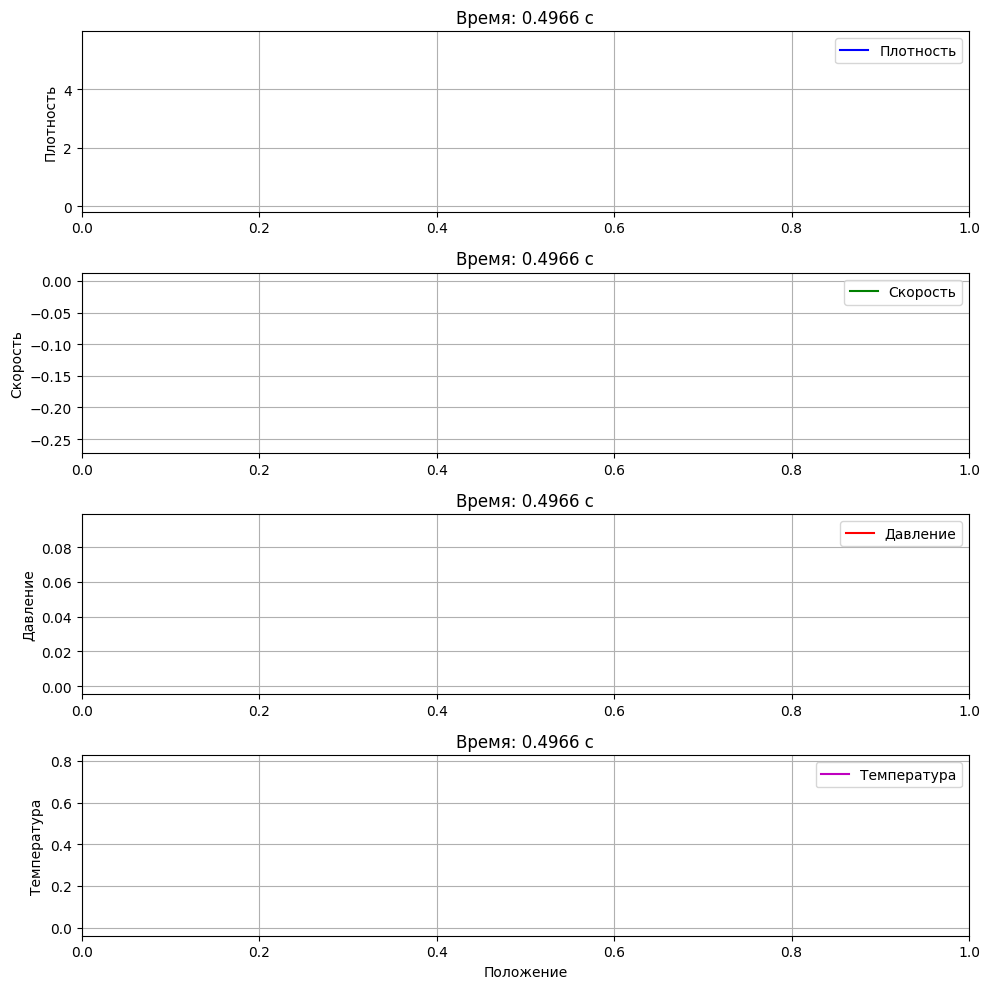

In [6]:
# Параметры
nx = 400  # число ячеек
L = 1.0   # длина области
dx = L / nx
gamma = 1.4  # показатель адиабаты

# Временной шаг, определяемый из условия Куранта
CFL = 0.1  # Уменьшено для повышения устойчивости

# Сетка
x = np.linspace(0.0, L, nx)

# Начальные условия
rho = np.zeros(nx)
u = np.zeros(nx)
p = np.zeros(nx)

T_target = 1100  # Температура в Кельвинах

R_specific = 287.05

# Вычисляем нужное давление на основе плотности и температуры
p_initial_left = T_target * rho[0] * R_specific

# Разрыв посередине
rho[:nx//2] = 1.0     # плотность слева
rho[nx//2:] = 0.125   # плотность справа
p[:nx//2] = p_initial_left       # давление слева
p[nx//2:] = 0.1       # давление справа
u[:] = 0.0            # скорость везде нулевая

# Консервативные переменные
E = p / (gamma - 1) + 0.5 * rho * u**2  # полная энергия
U = np.zeros((nx, 3))  # [rho, rho*u, E]
U[:, 0] = rho          # плотность
U[:, 1] = rho * u      # импульс
U[:, 2] = E            # энергия

def compute_flux(U):
    rho = U[:, 0]
    u = U[:, 1] / rho
    E = U[:, 2]

    p = (gamma - 1) * (E - 0.5 * rho * u**2)
    p = np.maximum(p, 1e-8)
    
    F = np.zeros_like(U)
    F[:, 0] = rho * u
    F[:, 1] = rho * u**2 + p
    F[:, 2] = (E + p) * u
    return F

def compute_slopes(U):
    dU_plus = np.roll(U, -1, axis=0) - U
    dU_minus = U - np.roll(U, 1, axis=0)
    slopes = minmod(dU_minus, dU_plus)
    return slopes

def minmod(a, b):
    return 0.5 * (np.sign(a) + np.sign(b)) * np.minimum(np.abs(a), np.abs(b))

def hllc_flux(U_L, U_R):
    '''
    Вычисляет поток между двумя соседними ячейками сетки на основе их состояний 
    U_L и U_R (слева и справа от границы ячеек) с учетом контактного разрыва (HLLC).

    :param U_L: массив состояний (плотность, импульс, энергия) для левой стороны ячейки
    :param U_R: массив состояний для правой стороны ячейки

    :return F: Поток, вычисленный с учетом контактного разрыва (HLLC)
    '''
    # Вычисление параметров для левой ячейки
    rho_L = U_L[:, 0]
    u_L = U_L[:, 1] / rho_L
    E_L = U_L[:, 2]
    p_L = (gamma - 1) * (E_L - 0.5 * rho_L * u_L**2)
    p_L = np.maximum(p_L, 1e-8)
    a_L = np.sqrt(gamma * p_L / rho_L)

    # Вычисление параметров для правой ячейки
    rho_R = U_R[:, 0]
    u_R = U_R[:, 1] / rho_R
    E_R = U_R[:, 2]
    p_R = (gamma - 1) * (E_R - 0.5 * rho_R * u_R**2)
    p_R = np.maximum(p_R, 1e-8)
    a_R = np.sqrt(gamma * p_R / rho_R)

    # Определение скоростей S_L и S_R
    S_L = np.minimum(u_L - a_L, u_R - a_R)
    S_R = np.maximum(u_L + a_L, u_R + a_R)

    # Вычисление средней скорости S_M
    S_M = (p_R - p_L + rho_L * u_L * (S_L - u_L) - rho_R * u_R * (S_R - u_R)) / (rho_L * (S_L - u_L) - rho_R * (S_R - u_R))

    # Вычисление потоков для левого и правого состояний
    F_L = compute_flux(U_L)
    F_R = compute_flux(U_R)

    # Промежуточные состояния U_L* и U_R*
    U_L_star = np.zeros_like(U_L)
    U_R_star = np.zeros_like(U_R)

    # Левое промежуточное состояние (U_L*)
    U_L_star[:, 0] = rho_L * (S_L - u_L) / (S_L - S_M)
    U_L_star[:, 1] = U_L_star[:, 0] * S_M
    U_L_star[:, 2] = U_L_star[:, 0] * (
        E_L / rho_L + (S_M - u_L) * (S_M + p_L / (rho_L * (S_L - u_L)))
    )

    # Правое промежуточное состояние (U_R*)
    U_R_star[:, 0] = rho_R * (S_R - u_R) / (S_R - S_M)
    U_R_star[:, 1] = U_R_star[:, 0] * S_M
    U_R_star[:, 2] = U_R_star[:, 0] * (
        E_R / rho_R + (S_M - u_R) * (S_M + p_R / (rho_R * (S_R - u_R)))
    )

    # Итоговый поток F с учетом различных областей
    F = np.zeros_like(U_L)

    # Условия для вычисления потока
    idx_SL = S_L >= 0
    idx_SR = S_R <= 0
    idx_SM = (S_L < 0) & (S_R > 0) & (S_M >= 0)
    idx_SM_R = (S_L < 0) & (S_R > 0) & (S_M < 0)

    F[idx_SL] = F_L[idx_SL]  # если S_L >= 0, используем левый поток F_L
    F[idx_SR] = F_R[idx_SR]  # если S_R <= 0, используем правый поток F_R

    # Если средняя скорость S_M >= 0, используем промежуточное состояние U_L*
    F[idx_SM] = F_L[idx_SM] + S_L[idx_SM][:, np.newaxis] * (U_L_star[idx_SM] - U_L[idx_SM])

    # Если средняя скорость S_M < 0, используем промежуточное состояние U_R*
    F[idx_SM_R] = F_R[idx_SM_R] + S_R[idx_SM_R][:, np.newaxis] * (U_R_star[idx_SM_R] - U_R[idx_SM_R])

    return F

# Функции для анимации
def init():
    for line in lines:
        line.set_data([], [])
    return lines

def animate(i):
    rho_plot, u_plot, p_plot, T_plot = frames[i]
    lines[0].set_data(x, rho_plot)
    lines[1].set_data(x, u_plot)
    lines[2].set_data(x, p_plot)
    lines[3].set_data(x, T_plot)
    for ax in axes:
        ax.relim()
        ax.autoscale_view()
    # Обновляем заголовки с текущим временем
    axes[0].set_title(f'Время: {times[i]:.4f} с')
    axes[1].set_title(f'Время: {times[i]:.4f} с')
    axes[2].set_title(f'Время: {times[i]:.4f} с')
    axes[3].set_title(f'Время: {times[i]:.4f} с')
    plt.tight_layout()
    return lines

# Подготовка графиков для анимации
fig, axes = plt.subplots(4, 1, figsize=(10, 10))

lines = []
for i, label, color in zip(range(4), ['Плотность', 'Скорость', 'Давление', 'Температура'], ['b', 'g', 'r', 'm']):
    line, = axes[i].plot([], [], color=color, label=label)
    lines.append(line)
    axes[i].set_xlim(0, L)
    axes[i].set_ylabel(label)
    axes[i].legend()
    axes[i].grid(True)
axes[3].set_xlabel('Положение')

plt.tight_layout()

# Переменные для хранения данных анимации
frames = []
times = []

# Основной цикл с сбором данных для анимации
t = 0.0
t_end = 0.5  # конечное время симуляции
time_steps = 0  # Счетчик временных шагов

with tqdm(total=t_end, desc='Выполнение расчета', unit='шаг') as pbar:
    while t < t_end:
        rho = U[:, 0]
        u = U[:, 1] / rho
        E = U[:, 2]
        p = (gamma - 1) * (E - 0.5 * rho * u**2)
        p = np.maximum(p, 1e-8)
        rho = np.maximum(rho, 1e-8)
        a = np.sqrt(gamma * p / rho)
        s_max = np.max(np.abs(u) + a)

        # Вычисление шага времени
        dt = CFL * dx / s_max

        if t + dt > t_end:
            dt = t_end - t

        # Вычисление наклонов и реконструкция переменных
        slopes = compute_slopes(U)

        U_L = U - 0.5 * slopes
        U_R = U + 0.5 * slopes

        # Формирование массивов левых и правых состояний на интерфейсах
        U_L_interface = U_R[:-1]
        U_R_interface = U_L[1:]

        # Вычисление потоков на границах ячеек
        F_half = hllc_flux(U_L_interface, U_R_interface)

        # Обновление консервативных переменных
        U_new = U.copy()
        U_new[1:-1] -= dt/dx * (F_half[1:] - F_half[:-1])

        # Граничные условия (жесткие стенки)
        U_new[0] = U_new[1]
        U_new[-1] = U_new[-2]

        # Проверка на отрицательные плотности и энергии
        U_new[:, 0] = np.maximum(U_new[:, 0], 1e-8)  # плотность
        U_new[:, 2] = np.maximum(U_new[:, 2], 1e-8)  # энергия

        U = U_new.copy()

        # Сбор данных для анимации каждые 20 временных шагов
        if time_steps % 20 == 0 or t >= t_end:
            rho_plot = U[:, 0]
            u_plot = U[:, 1] / rho_plot
            E_plot = U[:, 2]
            p_plot = (gamma - 1) * (E_plot - 0.5 * rho_plot * u_plot**2)
            p_plot = np.maximum(p_plot, 1e-8)
            T_plot = p_plot / rho_plot  # Температура пропорциональна p / rho

            # Сохраняем данные для анимации
            frames.append((rho_plot.copy(), u_plot.copy(), p_plot.copy(), T_plot.copy()))
            times.append(t)

            # # Обновление графика на экране
            animate(len(frames) - 1)
            clear_output(wait=True)
            display(fig)

        t += dt
        pbar.update(dt)
        time_steps += 1

    # Обновляем прогресс-бар на случай, если цикл завершился до t_end
    if t < t_end:
        pbar.update(t_end - t)

anim = FuncAnimation(fig, animate, init_func=init, frames=len(frames), interval=50, blit=False)
anim.save('riemann_problem_animation_with_temperature.gif', writer='pillow', fps=20)
clear_output(wait=True)
HTML(anim.to_jshtml())
